# Livrable 2 — Débruitage d'Images par Auto-encodeur
## Projet DS Leyenda — TouNum

---

### Contexte métier

Les images numérisées par **TouNum** présentent des artefacts liés au matériel de scan :
bruit gaussien, artefacts JPEG, poussière, variations de luminosité.
Ces imperfections dégradent les traitements avals (captioning, OCR, classification).

Ce notebook implémente un **réseau encodeur-décodeur U-Net** (TensorFlow)
pour débruiter automatiquement les images du dossier `data/noises/`.

### Approche : débruitage auto-supervisé (Noise-as-Target)

Sans images propres de référence, on adopte la stratégie **Noise2Noise** simplifiée :

```
  x        : image bruitée disponible dans data/noises/
  x + ε    : x + bruit gaussien synthétique  →  entrée réseau
  x        : image originale                 →  cible réseau

  Entraînement : minimiser |f(x+ε) − x|
  Inférence    : f(x) ≈ x_propre
```

Cette approche converge vers l'image propre si le bruit est centré en zéro (Lehtinen et al., Noise2Noise 2018).

### Workflow

```
Images bruitées  ──►  Exploration  ──►  Pipeline  ──►  U-Net  ──►  Évaluation  ──►  Interface
```

| Section | Contenu |
|---------|---------|
| **1. Exploration** | Analyse des images, types de bruit, statistiques |
| **2. Modèle** | Architecture U-Net, entraînement, évaluation |
| **3. Interface** | GUI de débruitage (image unique ou dossier) |

In [9]:
# ============================================================
# INSTALLATION DES DÉPENDANCES
# Même liste que le livrable 1 — seuls ces packages sont absents
# de l'image Docker TF de base.
# ============================================================

from pip._internal.cli.main import main as _pip_install

for _pkg in ['seaborn', 'ipywidgets', 'pandas', 'tqdm']:
    try:
        __import__(_pkg)
        print(f"{_pkg} : déjà installé")
    except ImportError:
        print(f"{_pkg} : installation en cours...")
        _pip_install(['install', '--quiet', _pkg])
        print(f"{_pkg} : installé")

print("\nDépendances OK.")

seaborn : déjà installé
ipywidgets : déjà installé
pandas : déjà installé
tqdm : déjà installé

Dépendances OK.


In [11]:
# ============================================================
# IMPORTS
# scipy et scikit-image sont exclus : ils ont été compilés pour
# numpy 1.x et sont incompatibles avec numpy 2.x présent dans
# cet environnement. On utilise PIL + numpy + tf.image à la place.
# ============================================================
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from PIL import Image, ImageFile, ImageFilter

from tqdm.notebook import tqdm

tf.random.set_seed(42)
np.random.seed(42)
plt.rcParams['figure.dpi'] = 100
sns.set_theme(style='whitegrid')

# ---- Fonctions de remplacement (scipy / skimage) ----

def gaussian_blur_pil(img_array, radius=2):
    """Remplace scipy.ndimage.gaussian_filter — utilise PIL."""
    pil = Image.fromarray(img_array.astype(np.uint8))
    return np.array(pil.filter(ImageFilter.GaussianBlur(radius=radius)), dtype=np.float32)

def norm_pdf(x, mu, sigma):
    """Remplace scipy.stats.norm.pdf — calcul direct numpy."""
    return np.exp(-0.5 * ((x - mu) / sigma) ** 2) / (sigma * np.sqrt(2 * np.pi))

def compute_psnr(y_true, y_pred):
    """PSNR via tf.image.psnr (évite scikit-image)."""
    t = tf.constant(y_true[None], dtype=tf.float32)
    p = tf.constant(y_pred[None], dtype=tf.float32)
    return float(tf.image.psnr(t, p, max_val=1.0).numpy())

def compute_ssim(y_true, y_pred):
    """SSIM via tf.image.ssim (évite scikit-image)."""
    t = tf.constant(y_true[None], dtype=tf.float32)
    p = tf.constant(y_pred[None], dtype=tf.float32)
    return float(tf.image.ssim(t, p, max_val=1.0).numpy())

# ---- GPU ----
print(f"TensorFlow : {tf.__version__}")
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpu, True)
    print(f"GPU disponible : {gpus[0].name}")
else:
    print("GPU non détecté — entraînement sur CPU")

TensorFlow : 2.14.0
GPU disponible : /physical_device:GPU:0


In [12]:
# ============================================================
# CONFIGURATION GLOBALE
# ============================================================

_candidates = ['./data', '/tf/notebooks/data']
_data_base  = next((p for p in _candidates if os.path.isdir(p)), None)
if _data_base is None:
    raise FileNotFoundError(
        "Dossier 'data/' introuvable.\n"
        "Vérifiez que le volume Docker est bien monté avec :\n"
        "  -v \"<dossier_projet>:/tf/notebooks\""
    )

os.chdir(os.path.dirname(os.path.abspath(_data_base)))
print(f"Répertoire de travail : {os.getcwd()}")

NOISES_DIR      = './data/noises'
OUTPUT_DIR      = './data/noises/output'
MODEL_SAVE_PATH = './model_denoising.h5'

IMG_SIZE      = (256, 256)
BATCH_SIZE    = 8
EPOCHS        = 60
LEARNING_RATE = 1e-3
VAL_SPLIT     = 0.2

# σ réduit 0.08 → 0.04 :
# Un sigma trop élevé entraîne le modèle à retirer beaucoup de bruit,
# ce qui se traduit par un sur-lissage visible à l'inférence.
NOISE_STD = 0.04

image_files = sorted(
    glob.glob(os.path.join(NOISES_DIR, '*.jpg'))  +
    glob.glob(os.path.join(NOISES_DIR, '*.jpeg')) +
    glob.glob(os.path.join(NOISES_DIR, '*.png'))
)

print(f"Images bruitées  : {len(image_files)}")
print(f"Dossier sortie   : {OUTPUT_DIR}")
print(f"Taille réseau    : {IMG_SIZE[0]}x{IMG_SIZE[1]} px")
print(f"Batch size       : {BATCH_SIZE} | Epochs max : {EPOCHS}")
print(f"sigma bruit      : {NOISE_STD}  (réduit de 0.08 → 0.04)")

Répertoire de travail : /tf/notebooks
Images bruitées  : 148
Dossier sortie   : ./data/noises/output
Taille réseau    : 256x256 px
Batch size       : 8 | Epochs max : 60
sigma bruit      : 0.04  (réduit de 0.08 → 0.04)


---
## 1. Exploration des Images Bruitées

Avant de construire le modèle, il est essentiel de **caractériser le bruit** présent :
- Quelle est sa nature ? (gaussien, sel & poivre, artefacts JPEG…)
- Quelle est son amplitude ?
- Y a-t-il des patterns spatiaux (bandes, vignettage) ?

Cette analyse guidera les choix d'architecture et de stratégie d'entraînement.

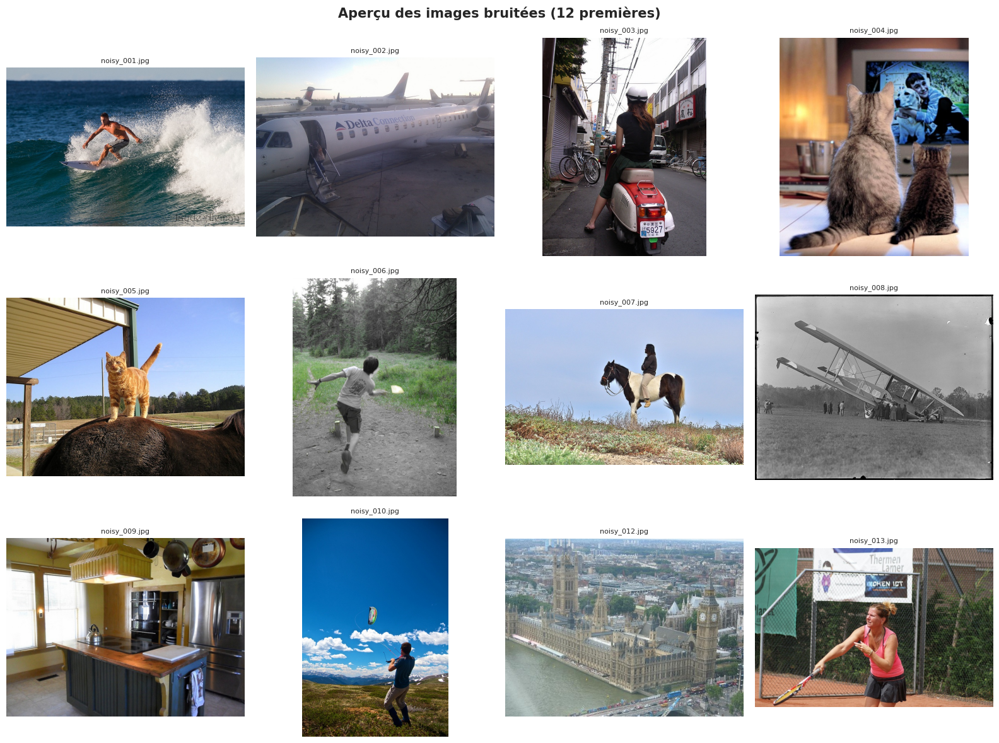

Total d'images dans le dossier : 148


In [4]:
# ============================================================
# AFFICHAGE D'UN ÉCHANTILLON D'IMAGES BRUITÉES
# ============================================================

n_show       = min(12, len(image_files))
sample_files = image_files[:n_show]

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
fig.suptitle(f"Aperçu des images bruitées ({n_show} premières)",
             fontsize=15, fontweight='bold')

for idx, (ax, fpath) in enumerate(zip(axes.flatten(), sample_files)):
    img = Image.open(fpath).convert('RGB')
    ax.imshow(img)
    ax.set_title(os.path.basename(fpath), fontsize=8)
    ax.axis('off')

for ax in axes.flatten()[n_show:]:
    ax.axis('off')

plt.tight_layout()
plt.show()
print(f"Total d'images dans le dossier : {len(image_files)}")

Analyse:   0%|          | 0/148 [00:00<?, ?it/s]

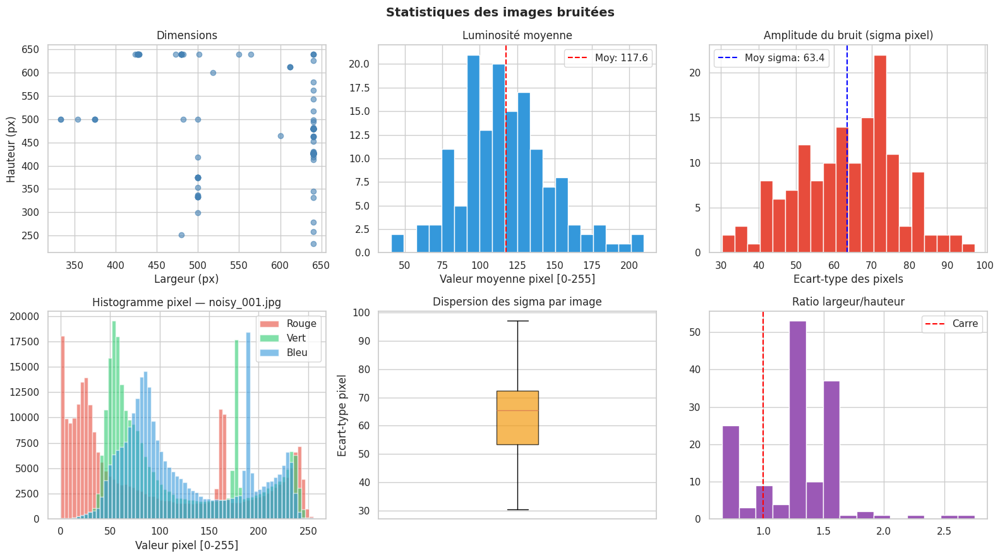


Statistiques globales :
       largeur  hauteur  moyenne    std
count    148.0    148.0    148.0  148.0
mean     583.9    478.8    117.6   63.4
std       86.2     95.2     30.2   13.6
min      333.0    233.0     40.9   30.3
25%      500.0    427.0     96.4   53.4
50%      640.0    480.0    114.0   65.4
75%      640.0    500.0    135.0   72.5
max      640.0    640.0    209.7   97.3


In [5]:
# ============================================================
# ANALYSE STATISTIQUE DES IMAGES
# Dimensions, luminosité moyenne, amplitude du bruit (écart-type)
# ============================================================

ImageFile.LOAD_TRUNCATED_IMAGES = True

records = []
for fpath in tqdm(image_files, desc='Analyse'):
    img = Image.open(fpath).convert('RGB')
    w, h = img.size
    arr  = np.array(img, dtype=np.float32)
    records.append({
        'fichier' : os.path.basename(fpath),
        'largeur' : w,
        'hauteur' : h,
        'ratio'   : round(w / h, 2),
        'moyenne' : round(float(arr.mean()), 1),
        'std'     : round(float(arr.std()), 1),
    })

df = pd.DataFrame(records)

fig, axes = plt.subplots(2, 3, figsize=(16, 9))
fig.suptitle('Statistiques des images bruitées', fontsize=14, fontweight='bold')

# Dimensions
axes[0,0].scatter(df['largeur'], df['hauteur'], alpha=0.6, c='steelblue')
axes[0,0].set_xlabel('Largeur (px)')
axes[0,0].set_ylabel('Hauteur (px)')
axes[0,0].set_title('Dimensions')

# Distribution des moyennes
axes[0,1].hist(df['moyenne'], bins=20, color='#3498db', edgecolor='white')
axes[0,1].axvline(df['moyenne'].mean(), color='red', ls='--',
                   label=f"Moy: {df['moyenne'].mean():.1f}")
axes[0,1].set_title('Luminosité moyenne')
axes[0,1].set_xlabel('Valeur moyenne pixel [0-255]')
axes[0,1].legend()

# Distribution des std
axes[0,2].hist(df['std'], bins=20, color='#e74c3c', edgecolor='white')
axes[0,2].axvline(df['std'].mean(), color='blue', ls='--',
                   label=f"Moy sigma: {df['std'].mean():.1f}")
axes[0,2].set_title('Amplitude du bruit (sigma pixel)')
axes[0,2].set_xlabel('Ecart-type des pixels')
axes[0,2].legend()

# Histogramme pixel d'une image
sample_arr = np.array(Image.open(image_files[0]).convert('RGB'), dtype=np.float32)
for c, (col, lbl) in enumerate([('#e74c3c','Rouge'), ('#2ecc71','Vert'), ('#3498db','Bleu')]):
    axes[1,0].hist(sample_arr[:,:,c].flatten(), bins=64, alpha=0.6, color=col, label=lbl)
axes[1,0].set_xlabel('Valeur pixel [0-255]')
axes[1,0].set_title(f"Histogramme pixel — {os.path.basename(image_files[0])}")
axes[1,0].legend()

# Boxplot std
axes[1,1].boxplot(df['std'], vert=True, patch_artist=True,
                   boxprops={'facecolor': '#f39c12', 'alpha': 0.7})
axes[1,1].set_title('Dispersion des sigma par image')
axes[1,1].set_ylabel('Ecart-type pixel')
axes[1,1].set_xticks([])

# Ratio
axes[1,2].hist(df['ratio'], bins=15, color='#9b59b6', edgecolor='white')
axes[1,2].axvline(1.0, color='red', ls='--', label='Carre')
axes[1,2].set_title('Ratio largeur/hauteur')
axes[1,2].legend()

plt.tight_layout()
plt.show()

print('\nStatistiques globales :')
print(df[['largeur','hauteur','moyenne','std']].describe().round(1).to_string())

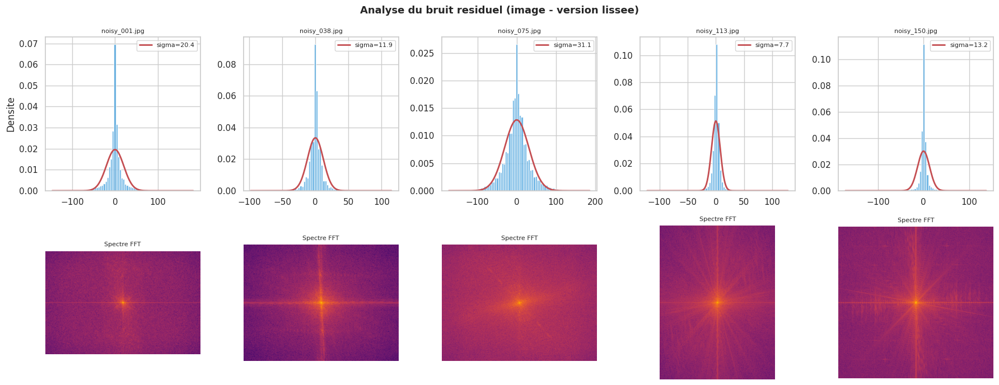


Kurtosis excess (1ere image) : 7.398  (0 = gaussien parfait)
  -> Bruit leptokurtique (queues plus lourdes qu'une gaussienne)

Strategie : le modele sera entraine avec un bruit gaussien additif synthetique.


In [6]:
# ============================================================
# ANALYSE DU TYPE DE BRUIT
#
# Methode : bruit residuel = image - version lissee (PIL GaussianBlur)
# Distribution gaussienne des residus  ->  bruit additif gaussien
# Pics aux extremes                    ->  sel & poivre
# Patterns structures en FFT           ->  artefacts JPEG
#
# Remplacement scipy : gaussian_filter -> PIL.ImageFilter.GaussianBlur
#                      norm.pdf        -> calcul numpy direct
#                      shapiro-wilk    -> kurtosis numpy
# ============================================================

def estimate_noise_residual(img_path, blur_radius=2):
    """Extrait le bruit = image - version lissee (sans scipy)."""
    img  = np.array(Image.open(img_path).convert('L'), dtype=np.float32)
    blur = gaussian_blur_pil(img, radius=blur_radius)
    return (img - blur).flatten()

sample_indices = np.linspace(0, len(image_files)-1, 5, dtype=int)
sample_paths   = [image_files[i] for i in sample_indices]

fig, axes = plt.subplots(2, len(sample_paths), figsize=(18, 7))
fig.suptitle('Analyse du bruit residuel (image - version lissee)',
             fontsize=13, fontweight='bold')

for j, fpath in enumerate(sample_paths):
    residuals = estimate_noise_residual(fpath)
    mu, sigma = residuals.mean(), residuals.std()
    x = np.linspace(residuals.min(), residuals.max(), 200)

    axes[0, j].hist(residuals, bins=80, density=True, color='#3498db', alpha=0.75)
    axes[0, j].plot(x, norm_pdf(x, mu, sigma), 'r-', lw=2, label=f'sigma={sigma:.1f}')
    axes[0, j].set_title(os.path.basename(fpath), fontsize=8)
    axes[0, j].legend(fontsize=8)
    if j == 0:
        axes[0, j].set_ylabel('Densite')

    img_gray = np.array(Image.open(fpath).convert('L'), dtype=np.float32)
    fft_mag  = np.abs(np.fft.fftshift(np.fft.fft2(img_gray)))
    axes[1, j].imshow(np.log1p(fft_mag), cmap='inferno')
    axes[1, j].axis('off')
    axes[1, j].set_title('Spectre FFT', fontsize=8)

plt.tight_layout()
plt.show()

# Test de normalite via kurtosis (remplace Shapiro-Wilk de scipy)
# Kurtosis excess ~ 0 -> distribution proche d'une gaussienne
residuals_all = estimate_noise_residual(image_files[0])
kurt = float(((residuals_all - residuals_all.mean())**4).mean() / residuals_all.std()**4 - 3)
print(f"\nKurtosis excess (1ere image) : {kurt:.3f}  (0 = gaussien parfait)")
if abs(kurt) < 1.0:
    print("  -> Bruit proche d'une distribution gaussienne")
elif kurt > 1.0:
    print("  -> Bruit leptokurtique (queues plus lourdes qu'une gaussienne)")
else:
    print("  -> Bruit platykurtique (queues plus legeres qu'une gaussienne)")
print("\nStrategie : le modele sera entraine avec un bruit gaussien additif synthetique.")

---
## 2. Modèle de Débruitage — Auto-encodeur U-Net

### 2a. Préparation des données

#### Stratégie d'entraînement auto-supervisé

Sans images propres de référence, on adopte la stratégie **Noise-as-Target** :

```
  x      : image bruitée disponible dans data/noises/
  x + e  : x + bruit gaussien synthetique  ->  entree reseau
  x      : image originale                 ->  cible reseau

  Entrainement : minimiser |f(x+e) - x|
  Inference    : f(x) ≈ x_propre
```

Cette approche converge vers l'image propre idéale si le bruit est centré en zéro
(Lehtinen et al., Noise2Noise 2018).

#### Pipeline

```
  Fichiers .jpg  ->  Chargement PIL  ->  Resize 256x256  ->  [0,1]
      ->  Split train/val  ->  tf.data : augmentation + ajout bruit  ->  batches
```

In [7]:
# ============================================================
# CHARGEMENT DE TOUTES LES IMAGES EN MEMOIRE
# ~148 images x 256x256x3 float32 ≈ 150 Mo (tenable en RAM)
# ============================================================

ImageFile.LOAD_TRUNCATED_IMAGES = True

all_images = []
for fpath in tqdm(image_files, desc='Chargement'):
    try:
        img = Image.open(fpath).convert('RGB').resize(IMG_SIZE, Image.LANCZOS)
        all_images.append(np.array(img, dtype=np.float32) / 255.0)
    except Exception as e:
        print(f"  Ignore ({os.path.basename(fpath)}) : {e}")

all_images = np.array(all_images)   # (N, H, W, 3)
print(f"\nDataset : {all_images.shape}")
print(f"Plage   : [{all_images.min():.3f}, {all_images.max():.3f}]")
print(f"RAM     : ~{all_images.nbytes / 1e6:.1f} Mo")

# Melange aleatoire avant split pour eviter le biais d'ordre
np.random.shuffle(all_images)
n_val        = max(1, int(len(all_images) * VAL_SPLIT))
train_images = all_images[:-n_val]
val_images   = all_images[-n_val:]

print(f"\nSplit — Train : {len(train_images)} | Val : {len(val_images)}")

Chargement:   0%|          | 0/148 [00:00<?, ?it/s]


Dataset : (148, 256, 256, 3)
Plage   : [0.000, 1.000]
RAM     : ~116.4 Mo

Split — Train : 119 | Val : 29


In [9]:
# ============================================================
# PIPELINE tf.data
# Chaque image passe par :
#   1. Augmentation spatiale (flips aleatoires) - train uniquement
#   2. Ajout de bruit gaussien sigma=NOISE_STD  ->  entree reseau
#   3. Image originale                           ->  cible reseau
# ============================================================

AUTOTUNE = tf.data.AUTOTUNE

def add_gaussian_noise(image, std=NOISE_STD):
    noise = tf.random.normal(shape=tf.shape(image), mean=0.0, stddev=std)
    return tf.clip_by_value(image + noise, 0.0, 1.0)

def train_pair(image):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    image = tf.clip_by_value(
        tf.image.random_brightness(image, max_delta=0.05), 0.0, 1.0
    )
    return add_gaussian_noise(image), image

def val_pair(image):
    return add_gaussian_noise(image), image

train_ds = (
    tf.data.Dataset.from_tensor_slices(train_images)
    .shuffle(len(train_images), seed=42)
    .map(train_pair, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

val_ds = (
    tf.data.Dataset.from_tensor_slices(val_images)
    .map(val_pair, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

print("Pipeline configure.")
print(f"  train_ds : {tf.data.experimental.cardinality(train_ds)} batches")
print(f"  val_ds   : {tf.data.experimental.cardinality(val_ds)} batches")

Pipeline configure.
  train_ds : 15 batches
  val_ds   : 4 batches


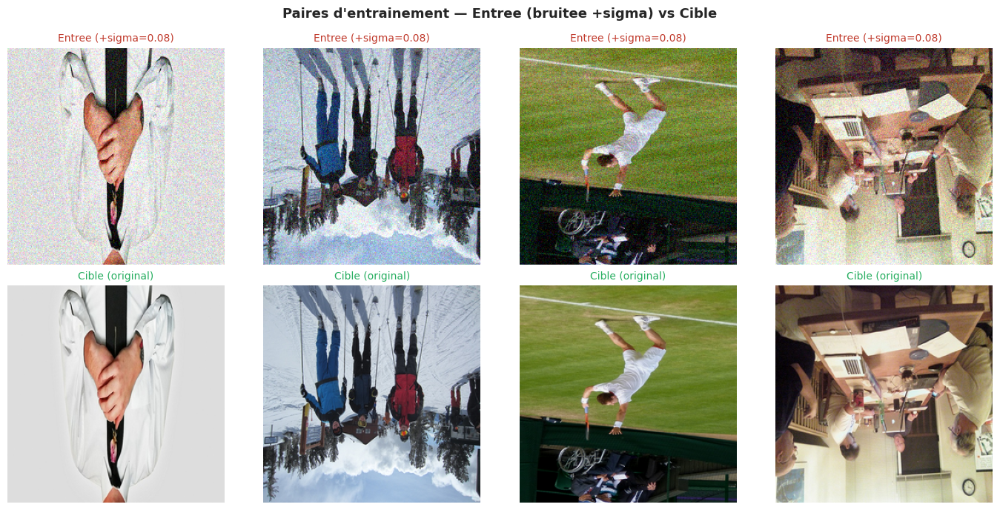

In [10]:
# ============================================================
# VISUALISATION DES PAIRES D'ENTRAINEMENT
# Montre ce que le reseau recoit en entree vs ce qu'il doit produire
# ============================================================

for batch_noisy, batch_clean in train_ds.take(1):
    pass

n_show = 4
fig, axes = plt.subplots(2, n_show, figsize=(14, 7))
fig.suptitle("Paires d'entrainement — Entree (bruitee +sigma) vs Cible",
             fontsize=13, fontweight='bold')

for j in range(n_show):
    axes[0, j].imshow(np.clip(batch_noisy[j].numpy(), 0, 1))
    axes[0, j].axis('off')
    axes[0, j].set_title(f"Entree (+sigma={NOISE_STD})", fontsize=10, color='#c0392b')

    axes[1, j].imshow(np.clip(batch_clean[j].numpy(), 0, 1))
    axes[1, j].axis('off')
    axes[1, j].set_title("Cible (original)", fontsize=10, color='#27ae60')

plt.tight_layout()
plt.show()

---
### 2b. Architecture — U-Net à Apprentissage Résiduel

#### Pourquoi un auto-encodeur ?

L'**auto-encodeur** compresse l'image vers une représentation compacte (code latent), puis la reconstruit.
Le **goulot d'étranglement** force le réseau à ignorer le bruit haute fréquence
et à ne retenir que la **structure sémantique** de l'image.

#### Pourquoi U-Net ?

Le **U-Net** (Ronneberger et al., 2015) ajoute des **connexions de saut (skip connections)**
entre encodeur et décodeur, préservant les détails fins que le bottleneck aurait perdus.

#### Apprentissage résiduel (résidu de bruit)

Au lieu de prédire l'image propre directement, le réseau **prédit le bruit** et le soustrait :

```
  Sortie directe   : f(x) ≈ x_propre          ← risque de "tout flouter" (solution de facilité)
  Sortie résiduelle: f(x) = x - reseau(x)     ← force à faire des corrections minimales
```

Cela empêche le modèle de converger vers une solution floue (moyenne de toutes les images possibles).

```
 INPUT (256x256x3)
   |
   +-- ENC 1 -- Conv(32)x2 -> BN -> ReLU -> MaxPool -------------------------+ skip
   |            256x256x32  ->  128x128x32                                   |
   +-- ENC 2 -- Conv(64)x2 -> BN -> ReLU -> MaxPool --------------+ skip     |
   |            128x128x64  ->   64x64x64                         |          |
   +-- ENC 3 -- Conv(128)x2 -> BN -> ReLU -> MaxPool -----+ skip  |          |
   |             64x64x128  ->   32x32x128                 |       |          |
   +-- BOTTLENECK -- Conv(256)x2 -> BN -> ReLU             |       |          |
   |                 32x32x256                              |       |          |
   +-- DEC 3 -- UpSampling -> Concat -> Conv(128)x2 -------+       |          |
   +-- DEC 2 -- UpSampling -> Concat -> Conv(64)x2 ----------------+          |
   +-- DEC 1 -- UpSampling -> Concat -> Conv(32)x2 ----------------------------+
   |            256x256x32
   |
   +-- Conv2D(3, 1x1, tanh)  ->  résidu de bruit  [−1, 1]
   |
 OUTPUT = clip(INPUT − résidu, 0, 1)   ->  256x256x3
```

| Composant | Rôle |
|-----------|------|
| **Conv2D(3x3)** | Extraction de features locales |
| **BatchNormalization** | Stabilise l'entraînement |
| **MaxPooling2D / UpSampling2D** | Compression / restauration de résolution |
| **Concatenate** | Skip connection — préserve les détails fins |
| **tanh (sortie)** | Résidu borné [−1, 1], centré en 0 |
| **Subtract + clip** | Soustrait le bruit prédit, résultat en [0, 1] |

In [ ]:
# ============================================================
# CONSTRUCTION DU U-NET RÉSIDUEL
# Le réseau prédit le bruit à soustraire (pas l'image propre).
# Cela empêche la convergence vers une solution floue.
# ============================================================

def conv_block(x, filters, dropout_rate=0.1):
    """Double convolution : Conv -> BN -> ReLU -> Conv -> BN -> ReLU (-> Dropout)."""
    x = layers.Conv2D(filters, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(filters, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    if dropout_rate > 0:
        x = layers.Dropout(dropout_rate)(x)
    return x


def build_unet(input_shape=(256, 256, 3)):
    """
    U-Net résiduel pour le débruitage.
    Le réseau prédit le résidu de bruit (sortie tanh) et le soustrait
    à l'image d'entrée. Empêche le sur-lissage dû à l'apprentissage direct.
    """
    inputs = layers.Input(shape=input_shape, name='image_bruitee')

    # ---- Encodeur ----
    c1 = conv_block(inputs, 32,  dropout_rate=0.0)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = conv_block(p1,     64,  dropout_rate=0.1)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    c3 = conv_block(p2,     128, dropout_rate=0.1)
    p3 = layers.MaxPooling2D((2, 2))(c3)

    # ---- Bottleneck ----
    b  = conv_block(p3,     256, dropout_rate=0.2)

    # ---- Décodeur ----
    u3 = layers.UpSampling2D((2, 2))(b)
    u3 = layers.Concatenate()([u3, c3])
    c4 = conv_block(u3, 128, dropout_rate=0.1)

    u2 = layers.UpSampling2D((2, 2))(c4)
    u2 = layers.Concatenate()([u2, c2])
    c5 = conv_block(u2, 64, dropout_rate=0.1)

    u1 = layers.UpSampling2D((2, 2))(c5)
    u1 = layers.Concatenate()([u1, c1])
    c6 = conv_block(u1, 32, dropout_rate=0.0)

    # ---- Sortie résiduelle ----
    # tanh : résidu de bruit borné [-1, 1], centré en 0
    # Le modèle fait des corrections minimales par défaut (bias = 0)
    noise_pred = layers.Conv2D(3, (1, 1), activation='tanh',
                               name='noise_residual')(c6)

    # Soustraction du bruit prédit + clip en [0, 1]
    outputs = layers.Lambda(
        lambda x: tf.clip_by_value(x[0] - x[1], 0.0, 1.0),
        name='image_debruitee'
    )([inputs, noise_pred])

    return keras.Model(inputs, outputs, name='UNet_Denoiser_Residual')


model = build_unet(input_shape=(*IMG_SIZE, 3))
model.summary()

dummy = tf.zeros((1, *IMG_SIZE, 3))
out   = model(dummy, training=False)
print(f"\nEntree : {dummy.shape}  ->  Sortie : {out.shape}")
print(f"Plage de sortie sur dummy zeros : [{out.numpy().min():.3f}, {out.numpy().max():.3f}]")

---
### 2c. Entraînement

#### Fonction de perte combinée

| Composante | Formule | Avantage |
|------------|---------|----------|
| **MAE (L1)** | `mean(|y_true - y_pred|)` | Préserve les contours — pénalise linéairement, pas quadratiquement |
| **1 - SSIM** | `1 - SSIM(y_true, y_pred)` | Optimise la qualité structurelle perçue |

**Perte combinée** : `L = 0.3 × MAE + 0.7 × (1 − SSIM)`

> **Pourquoi MAE plutôt que MSE ?**
> MSE pénalise les erreurs au **carré** → le modèle préfère la valeur moyenne floue pour minimiser le risque.
> MAE pénalise linéairement → le modèle peut conserver des valeurs extrêmes (bords nets, contrastes).

#### Callbacks

| Callback | Monitor | Rôle |
|----------|---------|------|
| **EarlyStopping** | `val_loss` | Arrête si pas de progrès pendant 10 epochs |
| **ReduceLROnPlateau** | `val_loss` | Réduit le LR ×0.5 après 4 epochs de stagnation |
| **ModelCheckpoint** | `val_loss` | Sauvegarde le meilleur modèle en `.h5` |

In [ ]:
# ============================================================
# FONCTIONS DE PERTE ET METRIQUE
# MAE remplace MSE : L1 préserve les bords, évite le flou moyen
# ============================================================

def ssim_loss(y_true, y_pred):
    """1 - SSIM : 0 = parfait, 1 = totalement different."""
    return 1.0 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))

def combined_loss(y_true, y_pred):
    """
    0.3 * MAE + 0.7 * (1 - SSIM)
    MAE (L1) : penalite lineaire -> preserve les contours et details nets
    SSIM     : optimise la qualite structurelle percue (contraste, texture)
    """
    mae_val  = tf.reduce_mean(tf.abs(y_true - y_pred))
    ssim_val = ssim_loss(y_true, y_pred)
    return 0.3 * mae_val + 0.7 * ssim_val

def psnr_metric(y_true, y_pred):
    """PSNR en dB : > 30 dB = bon debruitage."""
    return tf.reduce_mean(tf.image.psnr(y_true, y_pred, max_val=1.0))

print("Fonctions de perte definies.")
print("  combined_loss = 0.3 * MAE + 0.7 * (1 - SSIM)")
print("  psnr_metric   : dB (cible > 30 dB)")

In [13]:
# ============================================================
# COMPILATION ET CALLBACKS
# ============================================================

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=LEARNING_RATE),
    loss=combined_loss,
    metrics=[psnr_metric],
)

callbacks = [
    keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True,
        verbose=1,
    ),
    keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=4,
        min_lr=1e-7,
        verbose=1,
    ),
    keras.callbacks.ModelCheckpoint(
        filepath=MODEL_SAVE_PATH,
        monitor='val_loss',
        save_best_only=True,
        save_format='h5',
        verbose=1,
    ),
]

print("Modele compile.")
for cb in callbacks:
    print(f"  - {cb.__class__.__name__}")
print(f"  Sauvegarde : {MODEL_SAVE_PATH}")

Modele compile.
  - EarlyStopping
  - ReduceLROnPlateau
  - ModelCheckpoint
  Sauvegarde : ./model_denoising.h5


In [14]:
# ============================================================
# ENTRAINEMENT
# ============================================================

print("Debut de l'entrainement...")
print(f"  Train : {len(train_images)} images | Val : {len(val_images)} images")
print(f"  Batch size : {BATCH_SIZE} | Epochs max : {EPOCHS}")
print("-" * 50)

history = model.fit(
    train_ds,
    epochs=EPOCHS,
    validation_data=val_ds,
    callbacks=callbacks,
    verbose=1,
)

print(f"\nEntrainement termine. Meilleur modele : {MODEL_SAVE_PATH}")

Debut de l'entrainement...
  Train : 119 images | Val : 29 images
  Batch size : 8 | Epochs max : 60
--------------------------------------------------
Epoch 1/60


2026-05-18 16:51:57.208950: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inUNet_Denoiser/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2026-05-18 16:51:59.578144: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 6.49GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2026-05-18 16:51:59.724517: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 6.82GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2026-05-18 16:52:00.695799: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7ae5f0d6b440 initialized for plat

15/15 [==============================] - ETA: 0s - loss: 0.2722 - psnr_metric: 14.9298
Epoch 1: val_loss improved from inf to 0.47842, saving model to ./model_denoising.h5


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


15/15 [==============================] - 24s 578ms/step - loss: 0.2722 - psnr_metric: 14.9298 - val_loss: 0.4784 - val_psnr_metric: 5.1976 - lr: 0.0010
Epoch 2/60
15/15 [==============================] - ETA: 0s - loss: 0.1327 - psnr_metric: 19.2231
Epoch 2: val_loss improved from 0.47842 to 0.42945, saving model to ./model_denoising.h5
15/15 [==============================] - 3s 193ms/step - loss: 0.1327 - psnr_metric: 19.2231 - val_loss: 0.4294 - val_psnr_metric: 6.1989 - lr: 0.0010
Epoch 3/60
15/15 [==============================] - ETA: 0s - loss: 0.1169 - psnr_metric: 19.8353
Epoch 3: val_loss improved from 0.42945 to 0.24632, saving model to ./model_denoising.h5
15/15 [==============================] - 3s 197ms/step - loss: 0.1169 - psnr_metric: 19.8353 - val_loss: 0.2463 - val_psnr_metric: 12.2160 - lr: 0.0010
Epoch 4/60
15/15 [==============================] - ETA: 0s - loss: 0.1043 - psnr_metric: 21.3589
Epoch 4: val_loss did not improve from 0.24632
15/15 [===================

In [15]:
# ============================================================
# REPRISE APRES RESTART DU KERNEL
# Executer d'abord dans l'ordre :
#   cell-imports, cell-config, cell-loss,
#   cell-load-images, cell-pipeline
# ============================================================

if os.path.exists(MODEL_SAVE_PATH):
    model = keras.models.load_model(
        MODEL_SAVE_PATH,
        custom_objects={'combined_loss': combined_loss, 'psnr_metric': psnr_metric},
    )
    print(f"Modele charge : {MODEL_SAVE_PATH}")
    print(f"  Entree : {model.input_shape}  ->  Sortie : {model.output_shape}")
else:
    print(f"Aucun modele trouve a '{MODEL_SAVE_PATH}'.")
    print("Lancez l'entrainement (cell-build-model -> cell-compile -> cell-fit).")

Modele charge : ./model_denoising.h5
  Entree : (None, 256, 256, 3)  ->  Sortie : (None, 256, 256, 3)


---
## 3. Résultats et Évaluation

### Métriques de qualité image

| Métrique | Formule | Interprétation |
|----------|---------|----------------|
| **PSNR** | `10 log10(MAX^2 / MSE)` en dB | > 30 dB : bon, > 40 dB : excellent |
| **SSIM** | Similarité structurelle | 0 = aucune ressemblance, 1 = identique |

> Ces métriques sont calculées par rapport à la cible (image bruitée originale).
> Un gain visuel est attendu même sans images propres de référence (ground-truth).

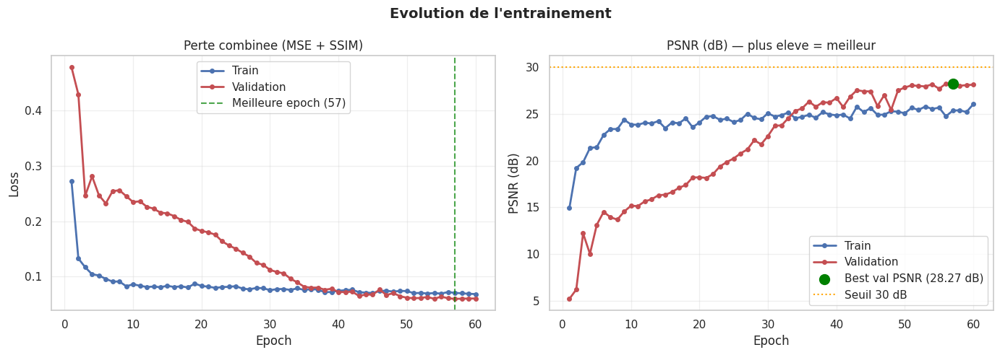


Resume :
  Epochs          : 60
  Best val PSNR   : 28.27 dB (epoch 57)
  Ecart train/val : 0.0080  -> Apprentissage stable


In [16]:
# ============================================================
# COURBES D'ENTRAINEMENT
# Necessite l'objet `history` — uniquement apres cell-fit
# ============================================================

def plot_history(history):
    epochs_ran   = range(1, len(history.history['loss']) + 1)
    key_psnr     = next(k for k in history.history if 'psnr' in k and 'val' not in k)
    key_val_psnr = next(k for k in history.history if 'psnr' in k and 'val' in k)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle("Evolution de l'entrainement", fontsize=14, fontweight='bold')

    ax1.plot(epochs_ran, history.history['loss'],     'b-o', ms=4, lw=2, label='Train')
    ax1.plot(epochs_ran, history.history['val_loss'], 'r-o', ms=4, lw=2, label='Validation')
    best_ep = int(np.argmin(history.history['val_loss'])) + 1
    ax1.axvline(best_ep, color='green', ls='--', alpha=0.7, label=f'Meilleure epoch ({best_ep})')
    ax1.set_title('Perte combinee (MSE + SSIM)')
    ax1.set_xlabel('Epoch'); ax1.set_ylabel('Loss')
    ax1.legend(); ax1.grid(True, alpha=0.3)

    ax2.plot(epochs_ran, history.history[key_psnr],     'b-o', ms=4, lw=2, label='Train')
    ax2.plot(epochs_ran, history.history[key_val_psnr], 'r-o', ms=4, lw=2, label='Validation')
    best_psnr = max(history.history[key_val_psnr])
    best_pe   = int(np.argmax(history.history[key_val_psnr])) + 1
    ax2.scatter([best_pe], [best_psnr], color='green', zorder=5, s=100,
                label=f'Best val PSNR ({best_psnr:.2f} dB)')
    ax2.axhline(30, color='orange', ls=':', label='Seuil 30 dB')
    ax2.set_title('PSNR (dB) — plus eleve = meilleur')
    ax2.set_xlabel('Epoch'); ax2.set_ylabel('PSNR (dB)')
    ax2.legend(); ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    gap = abs(history.history['loss'][-1] - history.history['val_loss'][-1])
    print(f"\nResume :")
    print(f"  Epochs          : {len(epochs_ran)}")
    print(f"  Best val PSNR   : {best_psnr:.2f} dB (epoch {best_pe})")
    print(f"  Ecart train/val : {gap:.4f}", end='  ')
    print("-> Surapprentissage modere" if gap > 0.05 else "-> Apprentissage stable")

plot_history(history)

/tmp/ipykernel_12/2483667652.py:40: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return float(tf.image.psnr(t, p, max_val=1.0).numpy())
/tmp/ipykernel_12/2483667652.py:46: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return float(tf.image.ssim(t, p, max_val=1.0).numpy())


Metriques sur le set de validation :
  PSNR moyen : 28.31 dB  (sigma = 1.64)
  SSIM moyen : 0.8819     (sigma = 0.0347)

  PSNR >= 25 dB -> acceptable, pistes d'amelioration possibles


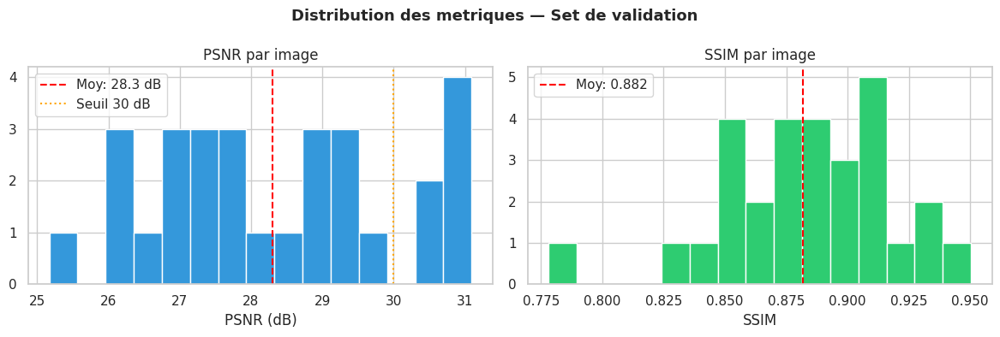

In [17]:
# ============================================================
# EVALUATION QUANTITATIVE — PSNR et SSIM sur le set de validation
# Utilise tf.image.psnr et tf.image.ssim (pas de scikit-image)
# ============================================================

psnr_scores, ssim_scores = [], []

for batch_noisy, batch_clean in val_ds:
    batch_pred = model.predict(batch_noisy, verbose=0)
    for i in range(len(batch_clean)):
        y_true = batch_clean[i].numpy()
        y_pred = np.clip(batch_pred[i], 0, 1)
        psnr_scores.append(compute_psnr(y_true, y_pred))
        ssim_scores.append(compute_ssim(y_true, y_pred))

print("Metriques sur le set de validation :")
print(f"  PSNR moyen : {np.mean(psnr_scores):.2f} dB  (sigma = {np.std(psnr_scores):.2f})")
print(f"  SSIM moyen : {np.mean(ssim_scores):.4f}     (sigma = {np.std(ssim_scores):.4f})")

if np.mean(psnr_scores) >= 30:
    print("\n  PSNR >= 30 dB -> qualite satisfaisante")
elif np.mean(psnr_scores) >= 25:
    print("\n  PSNR >= 25 dB -> acceptable, pistes d'amelioration possibles")
else:
    print("\n  PSNR < 25 dB -> entrainer plus longtemps ou augmenter la capacite du modele")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
fig.suptitle('Distribution des metriques — Set de validation', fontsize=13, fontweight='bold')

ax1.hist(psnr_scores, bins=15, color='#3498db', edgecolor='white')
ax1.axvline(np.mean(psnr_scores), color='red', ls='--',
            label=f"Moy: {np.mean(psnr_scores):.1f} dB")
ax1.axvline(30, color='orange', ls=':', label='Seuil 30 dB')
ax1.set_xlabel('PSNR (dB)'); ax1.set_title('PSNR par image'); ax1.legend()

ax2.hist(ssim_scores, bins=15, color='#2ecc71', edgecolor='white')
ax2.axvline(np.mean(ssim_scores), color='red', ls='--',
            label=f"Moy: {np.mean(ssim_scores):.3f}")
ax2.set_xlabel('SSIM'); ax2.set_title('SSIM par image'); ax2.legend()

plt.tight_layout()
plt.show()

/tmp/ipykernel_12/2483667652.py:40: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return float(tf.image.psnr(t, p, max_val=1.0).numpy())
/tmp/ipykernel_12/2483667652.py:46: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return float(tf.image.ssim(t, p, max_val=1.0).numpy())


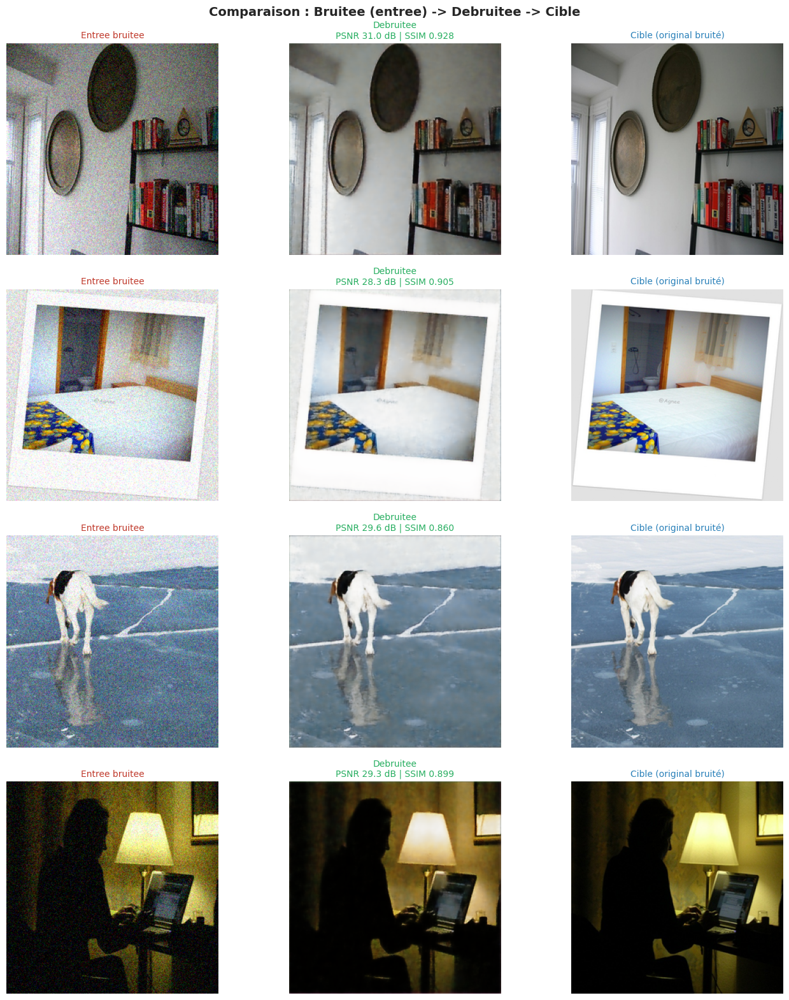

In [18]:
# ============================================================
# COMPARAISON VISUELLE — Bruitee vs Debruitee vs Cible
# ============================================================

n_show = 4
for batch_n, batch_c in val_ds.take(1):
    s_noisy = batch_n[:n_show].numpy()
    s_clean = batch_c[:n_show].numpy()
    break

s_pred = model.predict(s_noisy, verbose=0)

fig, axes = plt.subplots(n_show, 3, figsize=(14, 4 * n_show))
fig.suptitle("Comparaison : Bruitee (entree) -> Debruitee -> Cible",
             fontsize=14, fontweight='bold')

for i in range(n_show):
    noisy  = np.clip(s_noisy[i], 0, 1)
    pred   = np.clip(s_pred[i],  0, 1)
    target = np.clip(s_clean[i], 0, 1)
    p = compute_psnr(target, pred)
    s = compute_ssim(target, pred)

    axes[i,0].imshow(noisy);  axes[i,0].axis('off')
    axes[i,0].set_title('Entree bruitee', color='#c0392b', fontsize=10)
    axes[i,1].imshow(pred);   axes[i,1].axis('off')
    axes[i,1].set_title(f"Debruitee\nPSNR {p:.1f} dB | SSIM {s:.3f}",
                         color='#27ae60', fontsize=10)
    axes[i,2].imshow(target); axes[i,2].axis('off')
    axes[i,2].set_title('Cible (original bruité)', color='#2980b9', fontsize=10)

plt.tight_layout()
plt.show()

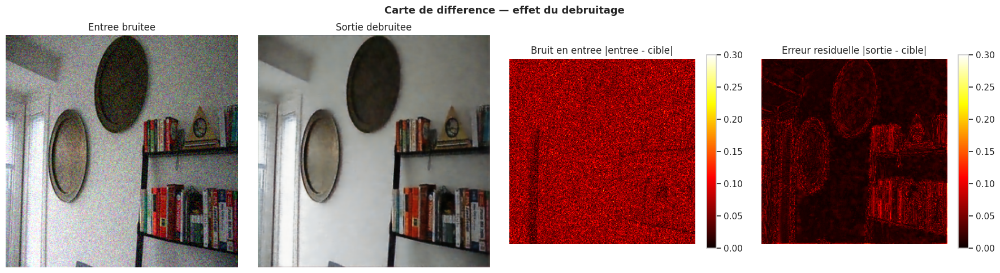

Erreur moyenne — avant : 0.0619  ->  apres : 0.0192
Reduction du bruit     : 68.9%


In [19]:
# ============================================================
# CARTE DE DIFFERENCE — Visualise ou le modele a agi
# La zone rouge = bruit supprime par le reseau
# ============================================================

idx    = 0
noisy  = np.clip(s_noisy[idx], 0, 1)
pred   = np.clip(s_pred[idx],  0, 1)
target = np.clip(s_clean[idx], 0, 1)

diff_before = np.abs(noisy  - target).mean(axis=-1)
diff_after  = np.abs(pred   - target).mean(axis=-1)

fig, axes = plt.subplots(1, 4, figsize=(18, 5))
fig.suptitle("Carte de difference — effet du debruitage",
             fontsize=13, fontweight='bold')

axes[0].imshow(noisy);  axes[0].axis('off'); axes[0].set_title('Entree bruitee')
axes[1].imshow(pred);   axes[1].axis('off'); axes[1].set_title('Sortie debruitee')

im2 = axes[2].imshow(diff_before, cmap='hot', vmin=0, vmax=0.3)
axes[2].axis('off'); axes[2].set_title('Bruit en entree |entree - cible|')
plt.colorbar(im2, ax=axes[2], shrink=0.8)

im3 = axes[3].imshow(diff_after, cmap='hot', vmin=0, vmax=0.3)
axes[3].axis('off'); axes[3].set_title('Erreur residuelle |sortie - cible|')
plt.colorbar(im3, ax=axes[3], shrink=0.8)

plt.tight_layout()
plt.show()

reduction = (1 - diff_after.mean() / max(diff_before.mean(), 1e-8)) * 100
print(f"Erreur moyenne — avant : {diff_before.mean():.4f}  ->  apres : {diff_after.mean():.4f}")
print(f"Reduction du bruit     : {reduction:.1f}%")

---
## 4. Débruitage des Images Réelles

L'entraînement auto-supervisé a appris à **supprimer le bruit** en s'entraînant sur des paires synthétiques.
À l'inférence, on applique le modèle **directement** sur les images réelles — sans aucun bruit ajouté :

```
  Entraînement : f(image_bruitée + ε_synthétique)  →  image_bruitée    [auto-supervisé]
  Inférence    : f(image_bruitée)                   →  image_débruitée  [direct]
```

Cette section montre le résultat sur les images `data/noises/` puis traite le dossier complet.

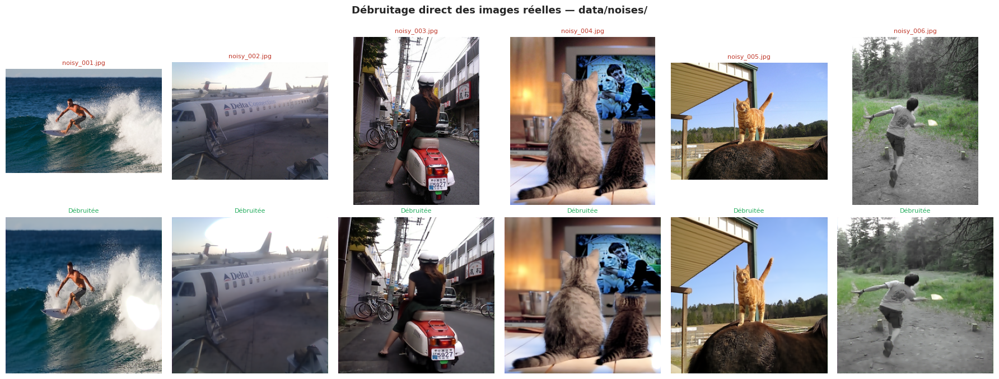

In [40]:
# ============================================================
# COMPARAISON VISUELLE — IMAGES RÉELLES data/noises/
# Passage direct dans le modèle : aucun bruit synthétique ajouté.
# ============================================================

n_show       = 6
sample_real  = image_files[:n_show]

fig, axes = plt.subplots(2, n_show, figsize=(18, 7))
fig.suptitle("Débruitage direct des images réelles — data/noises/",
             fontsize=13, fontweight='bold')

for j, fpath in enumerate(sample_real):
    img = Image.open(fpath).convert('RGB')
    arr = np.array(img, dtype=np.float32) / 255.0

    # Resize -> inférence -> resize retour (résolution originale)
    inp = np.expand_dims(
        np.array(img.resize(IMG_SIZE, Image.LANCZOS), dtype=np.float32) / 255.0, 0
    )
    out = np.clip(model.predict(inp, verbose=0)[0], 0, 1)

    axes[0, j].imshow(np.clip(arr, 0, 1))
    axes[0, j].axis('off')
    axes[0, j].set_title(os.path.basename(fpath)[:18], fontsize=8, color='#c0392b')

    axes[1, j].imshow(out)
    axes[1, j].axis('off')
    axes[1, j].set_title('Débruitée', fontsize=8, color='#27ae60')

axes[0, 0].set_ylabel('Originale bruitée', fontsize=10)
axes[1, 0].set_ylabel('Débruitée', fontsize=10)

plt.tight_layout()
plt.show()

Débruitage de 148 images réelles...
Sortie : ./data/noises/output



Débruitage:   0%|          | 0/148 [00:00<?, ?it/s]


Terminé : 148/148 images débruitées -> ./data/noises/output


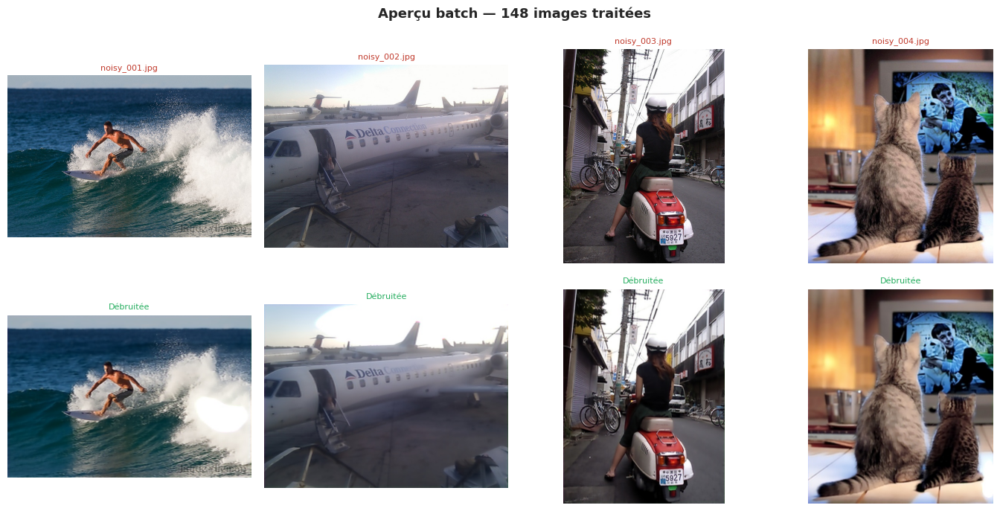

In [41]:
# ============================================================
# TRAITEMENT BATCH — TOUTES LES IMAGES data/noises/
# Sauvegarde dans OUTPUT_DIR avec préfixe "denoised_"
# ============================================================

os.makedirs(OUTPUT_DIR, exist_ok=True)
batch_results = []

print(f"Débruitage de {len(image_files)} images réelles...")
print(f"Sortie : {OUTPUT_DIR}\n")

for fpath in tqdm(image_files, desc='Débruitage'):
    try:
        img   = Image.open(fpath).convert('RGB')
        w, h  = img.size

        inp = np.expand_dims(
            np.array(img.resize(IMG_SIZE, Image.LANCZOS), dtype=np.float32) / 255.0, 0
        )
        out = np.clip(model.predict(inp, verbose=0)[0], 0, 1)

        # Retour à la résolution originale
        out_pil  = Image.fromarray((out * 255).astype(np.uint8)).resize((w, h), Image.LANCZOS)
        name     = 'denoised_' + os.path.basename(fpath)
        out_path = os.path.join(OUTPUT_DIR, name)
        ext      = os.path.splitext(fpath)[1].lower()
        out_pil.save(out_path, format='JPEG' if ext in ('.jpg', '.jpeg') else 'PNG', quality=95)
        batch_results.append({'fichier': os.path.basename(fpath), 'ok': True})
    except Exception as e:
        batch_results.append({'fichier': os.path.basename(fpath), 'ok': False, 'erreur': str(e)})

ok    = sum(r['ok'] for r in batch_results)
errs  = [r for r in batch_results if not r['ok']]
print(f"\nTerminé : {ok}/{len(image_files)} images débruitées -> {OUTPUT_DIR}")
if errs:
    print(f"{len(errs)} erreur(s) :")
    for r in errs:
        print(f"  {r['fichier']} : {r['erreur']}")

# Aperçu d'un échantillon des fichiers sauvegardés
saved = sorted([
    os.path.join(OUTPUT_DIR, f) for f in os.listdir(OUTPUT_DIR)
    if f.startswith('denoised_') and f.lower().endswith(('.jpg','.jpeg','.png'))
])[:4]

if saved:
    fig, axes = plt.subplots(2, len(saved), figsize=(14, 7))
    fig.suptitle(f"Aperçu batch — {ok} images traitées", fontsize=13, fontweight='bold')
    if len(saved) == 1:
        axes = np.array(axes).reshape(2, 1)
    for j, out_path in enumerate(saved):
        orig_name = os.path.basename(out_path).replace('denoised_', '')
        orig_path = os.path.join(NOISES_DIR, orig_name)
        den_arr   = np.array(Image.open(out_path).convert('RGB'), dtype=np.float32) / 255.0

        if os.path.exists(orig_path):
            orig_arr = np.array(Image.open(orig_path).convert('RGB'), dtype=np.float32) / 255.0
            axes[0, j].imshow(np.clip(orig_arr, 0, 1))
            axes[0, j].set_title(orig_name[:20], fontsize=8, color='#c0392b')
        else:
            axes[0, j].axis('off')

        axes[1, j].imshow(np.clip(den_arr, 0, 1))
        axes[1, j].set_title('Débruitée', fontsize=8, color='#27ae60')

        for ax in [axes[0, j], axes[1, j]]:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

---
## 5. Interface Graphique — Débruitage Interactif

L'interface ci-dessous permet de débruiter à la demande :
- **Image unique** : entrez le chemin complet d'un fichier `.jpg`, `.jpeg` ou `.png`
- **Dossier complet** : traitement en batch de toutes les images avec barre de progression

Le dossier de sortie est configurable (défaut : `data/noises/output`).
Chaque fichier est sauvegardé avec le préfixe `denoised_`.

> Le modèle est appliqué **directement** sur l'image bruitée, sans ajout de bruit synthétique.

In [ ]:
# ============================================================
# INTERFACE GRAPHIQUE — Débruitage interactif
#
# Minimum pour lancer cette cellule après un restart :
#   1. cell-imports  (imports + GPU)
#   2. cell-config   (MODEL_SAVE_PATH, IMG_SIZE, OUTPUT_DIR)
#   3. CETTE cellule
# ============================================================

import ipywidgets as widgets
from IPython.display import display, clear_output

# compile=False : combined_loss et psnr_metric ne sont pas nécessaires
# pour l'inférence — évite le NameError si cell-loss n'a pas été exécutée.
if os.path.exists(MODEL_SAVE_PATH):
    inference_model = keras.models.load_model(MODEL_SAVE_PATH, compile=False)
    print(f"Modèle chargé : {MODEL_SAVE_PATH}")
    print(f"Entrée : {inference_model.input_shape}  →  Sortie : {inference_model.output_shape}")
else:
    inference_model = model
    print("Utilisation du modèle courant en mémoire (model_denoising.h5 introuvable).")


def denoise_image(img_path: str):
    """Charge une image, la débruite et retourne les deux versions + métriques."""
    img  = Image.open(img_path).convert('RGB')
    w, h = img.size

    inp = np.expand_dims(
        np.array(img.resize(IMG_SIZE, Image.LANCZOS), dtype=np.float32) / 255.0, 0
    )
    out = np.clip(inference_model.predict(inp, verbose=0)[0], 0, 1)

    psnr_val = float(tf.image.psnr(
        tf.constant(inp[0][None]), tf.constant(out[None]), max_val=1.0
    ).numpy())
    ssim_val = float(tf.image.ssim(
        tf.constant(inp[0][None]), tf.constant(out[None]), max_val=1.0
    ).numpy())

    return inp[0], out, (w, h), psnr_val, ssim_val


# --- Widgets ---
path_input = widgets.Text(
    placeholder="Chemin d'une image (ex: ./data/noises/img001.jpg)",
    description='Image :',
    layout=widgets.Layout(width='640px'),
)

save_check = widgets.Checkbox(
    value=False,
    description=f"Sauvegarder dans {OUTPUT_DIR}/",
    layout=widgets.Layout(width='320px'),
)

denoise_btn = widgets.Button(
    description='Débruiter',
    button_style='success',
    icon='magic',
    layout=widgets.Layout(width='140px'),
)

output_area = widgets.Output()


def on_denoise(b):
    with output_area:
        clear_output(wait=True)

        img_path = path_input.value.strip()
        if not img_path:
            print("❌ Veuillez entrer un chemin d'image.")
            return
        if not os.path.exists(img_path):
            print(f"❌ Fichier introuvable : {img_path}")
            return

        try:
            arr_resized, arr_denoised, (w, h), psnr_val, ssim_val = denoise_image(img_path)
        except Exception as e:
            print(f"❌ Erreur : {e}")
            return

        # Sauvegarde optionnelle
        if save_check.value:
            os.makedirs(OUTPUT_DIR, exist_ok=True)
            name     = 'denoised_' + os.path.basename(img_path)
            out_path = os.path.join(OUTPUT_DIR, name)
            ext      = os.path.splitext(img_path)[1].lower()
            out_pil  = Image.fromarray((arr_denoised * 255).astype(np.uint8)).resize((w, h), Image.LANCZOS)
            out_pil.save(out_path, format='JPEG' if ext in ('.jpg', '.jpeg') else 'PNG', quality=95)
            print(f"✅ Sauvegardé : {out_path}")

        # Affichage côte à côte
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        fig.suptitle(
            f"Débruitage — {os.path.basename(img_path)}\n"
            f"PSNR : {psnr_val:.1f} dB  |  SSIM : {ssim_val:.4f}",
            fontsize=13, fontweight='bold',
        )

        axes[0].imshow(np.clip(arr_resized, 0, 1))
        axes[0].axis('off')
        axes[0].set_title('Entrée bruitée (256×256)', color='#c0392b', fontsize=11)

        axes[1].imshow(np.clip(arr_denoised, 0, 1))
        axes[1].axis('off')
        psnr_color = '#27ae60' if psnr_val >= 30 else '#e67e22'
        axes[1].set_title(f"Débruitée\nPSNR {psnr_val:.1f} dB | SSIM {ssim_val:.3f}",
                          color=psnr_color, fontsize=11)

        diff = np.abs(arr_resized - arr_denoised).mean(axis=-1)
        im   = axes[2].imshow(diff, cmap='hot', vmin=0, vmax=0.15)
        axes[2].axis('off')
        axes[2].set_title('Bruit supprimé (|entrée − sortie|)', fontsize=11)
        plt.colorbar(im, ax=axes[2], shrink=0.8)

        plt.tight_layout()
        plt.show()


denoise_btn.on_click(on_denoise)

ui = widgets.VBox([
    widgets.HTML('<h3 style="font-family:sans-serif;">🔧 Débruiteur d\'images — TouNum</h3>'),
    widgets.HBox([path_input, denoise_btn]),
    save_check,
    output_area,
])

display(ui)

Modèle chargé : ./model_denoising.h5
Entrée : (None, 256, 256, 3)  →  Sortie : (None, 256, 256, 3)
